# Implementation Bayesian Denoising Autoencoder on MRI Alzheimer dataset: training the models
In this notebook, the models are trained and hyperparameter tuned for MRI Alzheimer dataset. The notebook is structured as follows:
1. Load and preprocess data.
2. Implement autoencoder architectures (both linear and convolutional).
3. Implement noise scheme.
4. Training process
5. Visualizations of trained model.


## Data loading and processing

Installing packages

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data import random_split, DataLoader
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
!pip install -q tensorflow
%load_ext tensorboard

from skimage.metrics import structural_similarity as ssim

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

random_seed = 43
torch.manual_seed(random_seed)
np.random.seed(random_seed)

Mount Google Drive to import downloaded images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Set device to GPU if needed

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

Import MRI Alzheimer dataset

In [ ]:
import os
import glob
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

image_size = 128

class MRIDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.endswith('.jpeg') or fname.endswith('.jpg')]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('L')
        image.draft('L', (image_size, image_size))

        if self.transform:
            image = self.transform(image)

        # If you have labels, modify this part to return the corresponding label as well.
        return (image, 0)

# Define the path to your dataset
dataset_path = '/content/drive/MyDrive/mri_dataset'

transform = transforms.Compose([
    # transforms.Resize((image_size, image_size)),  # Resize images to 128x128
    transforms.ToTensor(),  # Convert images to PyTorch tensors
])

mri_dataset = MRIDataset(root_dir=dataset_path, transform=transform)

print(len(mri_dataset))

# Split dataset into train/validation/test sets
train_indices, temp_indices = train_test_split(np.arange(len(mri_dataset)), test_size=0.3, random_state=random_seed)
val_indices, test_indices = train_test_split(temp_indices, test_size=0.5, random_state=random_seed)

# Create data loaders
train_sampler = torch.utils.data.SubsetRandomSampler(train_indices)
val_sampler = torch.utils.data.SubsetRandomSampler(val_indices)
test_sampler = torch.utils.data.SubsetRandomSampler(test_indices)

train_loader = DataLoader(mri_dataset, batch_size=64, sampler=train_sampler)
val_loader = DataLoader(mri_dataset, batch_size=64, sampler=val_sampler)
test_loader = DataLoader(mri_dataset, batch_size=64, sampler=test_sampler)

# Checking dataset sizes
print(f'Training dataset size: {len(train_sampler)}')
print(f'Validation dataset size: {len(val_sampler)}')
print(f'Test dataset size: {len(test_sampler)}')

print(len(train_loader))


6400
Training dataset size: 4480
Validation dataset size: 960
Test dataset size: 960
70


Plot example images

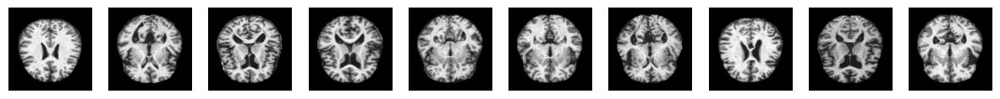

In [ ]:
# Get a batch of training data
data_iter = iter(train_loader)
images, _ = next(data_iter)

# Plot the first 10 images
fig, axes = plt.subplots(1, 10, figsize=(15, 1.5))
for i in range(10):
    ax = axes[i]
    ax.imshow(images[i].numpy().squeeze(), cmap='gray')
    ax.axis('off')

plt.show()

## Autoencoder Architectures

Setting dropout rate and creating MC Dropout function

In [ ]:
dropout_rate = 0.1

def MC_dropout(act_vec, p=0.5, mask=True):
  return F.dropout(act_vec, p=p, training=mask, inplace=False)

Linear autoencoders

In [ ]:
class LinearBDAE(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder layers
        self.enc_fc1 = nn.Linear(image_size*image_size, 1024)
        self.enc_fc2 = nn.Linear(1024, 512)
        self.enc_fc3 = nn.Linear(512, 256)

        # Decoder layers
        self.dec_fc1 = nn.Linear(256, 512)
        self.dec_fc2 = nn.Linear(512, 1024)
        self.dec_fc3 = nn.Linear(1024, image_size*image_size)

    def forward(self, x, dropout_p=dropout_rate, apply_dropout=True):
        # Encoder forward pass
        x = F.relu(self.enc_fc1(x))
        x = F.relu(self.enc_fc2(x))
        x = F.relu(self.enc_fc3(x))

        # Decoder forward pass with MC Dropout
        x = F.relu(self.dec_fc1(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.dec_fc2(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = torch.sigmoid(self.dec_fc3(x))
        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      return predictions, predictions_mean, predictions_var


class LinearDAE(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder layers
        self.enc_fc1 = nn.Linear(image_size*image_size, 1024)
        self.enc_fc2 = nn.Linear(1024, 512)
        self.enc_fc3 = nn.Linear(512, 256)

        # Decoder layers
        self.dec_fc1 = nn.Linear(256, 512)
        self.dec_fc2 = nn.Linear(512, 1024)
        self.dec_fc3 = nn.Linear(1024, image_size*image_size)

    def forward(self, x, dropout_p=dropout_rate, apply_dropout=True):
        # Encoder forward pass
        x = F.relu(self.enc_fc1(x))
        x = F.relu(self.enc_fc2(x))
        x = F.relu(self.enc_fc3(x))

        # Decoder forward pass with MC Dropout
        x = F.relu(self.dec_fc1(x))
        x = F.relu(self.dec_fc2(x))
        x = torch.sigmoid(self.dec_fc3(x))
        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      return predictions, predictions_mean, predictions_var

Convolutional autoencoders

In [ ]:
class ConvolutionalBDAE(nn.Module):
    def __init__(self):
        super().__init__()

        # Encoder layers
        self.conv1 = nn.Conv2d(1, 64, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(128, 256, 7)

        # Decoder layers
        self.deconv1 = nn.ConvTranspose2d(256, 128, 7)
        self.deconv2 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)
        self.deconv3 = nn.ConvTranspose2d(64, 1, 3, stride=2, padding=1, output_padding=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, dropout_p=dropout_rate, apply_dropout=True):
        # Encoder
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))

        # Decoder
        x = F.relu(self.deconv1(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = F.relu(self.deconv2(x))
        x = MC_dropout(x, p=dropout_p, mask=apply_dropout)
        x = self.sigmoid(self.deconv3(x))

        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y.view(-1, image_size*image_size)

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      predictions_mean = predictions_mean.view(-1, 1, image_size, image_size)
      predictions_var = predictions_var.view(-1, 1, image_size, image_size)

      return predictions, predictions_mean, predictions_var


class ConvolutionalDAE(nn.Module):
    def __init__(self):
        super().__init__()

        # Encoder layers
        self.conv1 = nn.Conv2d(1, 64, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(128, 256, 7)

        # Decoder layers
        self.deconv1 = nn.ConvTranspose2d(256, 128, 7)
        self.deconv2 = nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1)
        self.deconv3 = nn.ConvTranspose2d(64, 1, 3, stride=2, padding=1, output_padding=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x, dropout_p=0.1, apply_dropout=True):
        # Encoder
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))

        # Decoder
        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = self.sigmoid(self.deconv3(x))

        return x

    def sample_predict(self, x, Nsamples):
      predictions = x.data.new(Nsamples, x.shape[0], image_size*image_size)
      for i in range(Nsamples):
        y = self.forward(x)
        predictions[i] = y.view(-1, image_size*image_size)

      predictions_mean = torch.mean(predictions, dim=0)
      predictions_var = torch.var(predictions, dim=0)

      predictions_mean = predictions_mean.view(-1, 1, image_size, image_size)
      predictions_var = predictions_var.view(-1, 1, image_size, image_size)

      return predictions, predictions_mean, predictions_var

## Noise scheme

Function for adding Gaussian noise with noise factor parameter

In [ ]:
def add_gaussian_noise(images, noise_factor=0.5):
  corrupted_images = images + noise_factor * torch.randn(*images.shape)
  corrupted_images = np.clip(corrupted_images, 0., 1.)
  return corrupted_images

## Training Process

### Training functions

Training function for linear models

In [ ]:
def train_linear(train_loader, net, optimizer, criterion, noise_factor):
  total_loss = 0

  for i, data in enumerate(train_loader):

        images, _ = data
        images = images.view(images.size(0), -1)

        # ADD NOISE PROCESS
        corrupted_images = add_gaussian_noise(images, noise_factor)

        images = images.to(device)
        corrupted_images = corrupted_images.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net.forward(corrupted_images)

        loss = criterion(outputs, images)

        loss.backward()
        optimizer.step()

        # keep track of loss and accuracy
        total_loss += loss.item() * images.size(0)

  avg_loss = total_loss/len(train_loader.dataset)  # Compute average loss

  return avg_loss

Validation function for linear models

In [ ]:
def validation_linear(val_loader, net, criterion, Nsamples, noise_factor):
  total_loss = 0

  with torch.no_grad():
        for data in val_loader:
            # get the inputs; data is a list of [inputs, labels]
            images, _ = data
            images = images.view(images.size(0), -1)

            corrupted_images = add_gaussian_noise(images, noise_factor)

            images = images.to(device)
            corrupted_images = corrupted_images.to(device)

            # forward pass
            predictions, predictions_mean, predictions_var = net.sample_predict(corrupted_images, Nsamples)

            loss = criterion(predictions_mean, images)

            # keep track of loss and accuracy
            total_loss += loss.item() * images.size(0)

  return total_loss/len(val_loader.dataset)

Training function for convolutional models

In [ ]:
def train_convolutional(train_loader, net, optimizer, criterion, noise_factor):
  total_loss = 0

  for i, data in enumerate(train_loader):

        images, _ = data

        # ADD NOISE PROCESS
        corrupted_images = add_gaussian_noise(images, noise_factor)

        images = images.to(device)
        corrupted_images = corrupted_images.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net.forward(corrupted_images)

        loss = criterion(outputs, images)

        loss.backward()
        optimizer.step()

        # keep track of loss and accuracy
        total_loss += loss.item() * images.size(0)

  avg_loss = total_loss/len(train_loader.dataset)  # Compute average loss

  return avg_loss

Validation function for convolutional models

In [ ]:
def validation_convolutional(val_loader, net, criterion, Nsamples, noise_factor):
  total_loss = 0

  with torch.no_grad():
        for data in val_loader:
            # get the inputs; data is a list of [inputs, labels]
            images, _ = data

            corrupted_images = add_gaussian_noise(images, noise_factor)

            images = images.to(device)
            corrupted_images = corrupted_images.to(device)

            predictions, predictions_mean, predictions_var = net.sample_predict(corrupted_images, Nsamples)
            loss = criterion(predictions_mean, images)

            # keep track of loss and accuracy
            total_loss += loss.item() * images.size(0)

  return total_loss/len(val_loader.dataset)

### Training Procedure

Training the specified model. I use TensorBoard for evaluation in the next codeblock.

In [ ]:
# To completely clean your tensorboard uncomment and run the following command.
!rm -r runs
#Set random seed
torch.manual_seed(random_seed)

# Create a writer to write to Tensorboard
writer = SummaryWriter()

model = LinearBDAE().to(device) # Specify the model, choose from: LinearDAE(), Linear BDAE(), ConvolutionalDAE(), ConvolutionalBDAE()
noise_factor = 0.3
learning_rate = 0.001
save_path = f'mri_ES_linear_bdae_lr={learning_rate}_seed={random_seed}.pth'

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Early stopping
max_epochs = 100
patience = 5
best_val_loss = float('inf')
patience_counter = 0

Nsamples = 50

for epoch in tqdm(range(max_epochs)):  # loop over the dataset multiple times
    # Train on data
    train_loss = train_linear(train_loader, model, optimizer, criterion, noise_factor)

    val_loss = validation_linear(val_loader, model, criterion, Nsamples, noise_factor)

    # Log metrics to Tensorboard
    writer.add_scalars("Loss", {'Train': train_loss, 'Validation': val_loss}, epoch)

    # Check for early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        # Save the best model
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss
        }, save_path)
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs.")
            break

print('Finished Training')
print(f'Best validation loss = {best_val_loss}')

# Close the writer
writer.flush()
writer.close()

rm: cannot remove 'runs': No such file or directory


 99%|█████████▉| 99/100 [32:28<00:19, 19.68s/it]

Early stopping triggered after 100 epochs.
Finished Training
Best validation loss = 0.0011207697074860335


TensorBoard for evaluation

In [ ]:
%tensorboard --logdir runs/

<IPython.core.display.Javascript object>

## Visualizations

Examples of images displayed in validation set. First row is ground truth, second row is noisy image, third row is denoised image by above specified model.

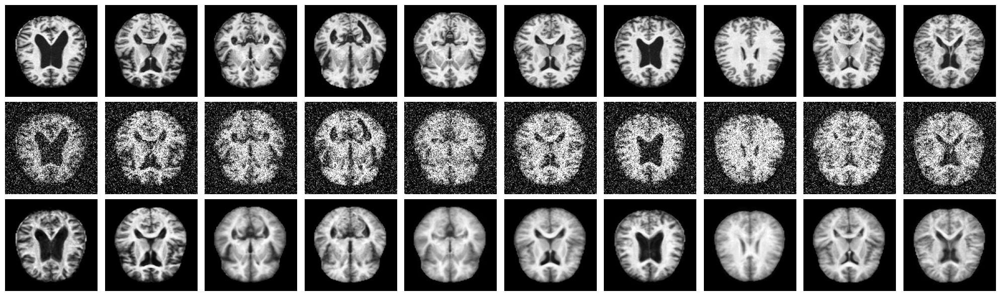

In [ ]:
def display_images(train_loader, net):
    images, _ = next(iter(train_loader))

    # Add noise to images
    corrupted_images = add_gaussian_noise(images, noise_factor)

    corrupted_images = corrupted_images.to(device).view(-1, 128*128)

    # Pass corrupted images through the network to get denoised images
    net.eval()
    with torch.no_grad():
        denoised_images = net(corrupted_images)

    # Convert images to numpy for visualization
    images_np = images.numpy()
    corrupted_images_np = corrupted_images.view(denoised_images.size(0), 1, image_size, image_size).cpu().numpy()
    denoised_images_np = denoised_images.view(denoised_images.size(0), 1, image_size, image_size).cpu().numpy()

    # Display images
    fig, axes = plt.subplots(nrows=3, ncols=10, figsize=(20, 6))
    for i in range(10):
        # Original images
        ax = axes[0, i]
        ax.imshow(images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

        # Corrupted images
        ax = axes[1, i]
        ax.imshow(corrupted_images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

        # Denoised images
        ax = axes[2, i]
        ax.imshow(denoised_images_np[i].transpose(1, 2, 0), cmap='gray')
        ax.axis('off')

    axes[0, 0].set_ylabel('Original', size='large')
    axes[1, 0].set_ylabel('Corrupted', size='large')
    axes[2, 0].set_ylabel('Denoised', size='large')

    plt.tight_layout()
    plt.show()

display_images(val_loader, model)

Examples of denoised images and corresponding uncertainty for BDAE on validation set. First row is ground truth, second row are noisy images, third row are denoised images, fourth row is corresponding uncertainty.

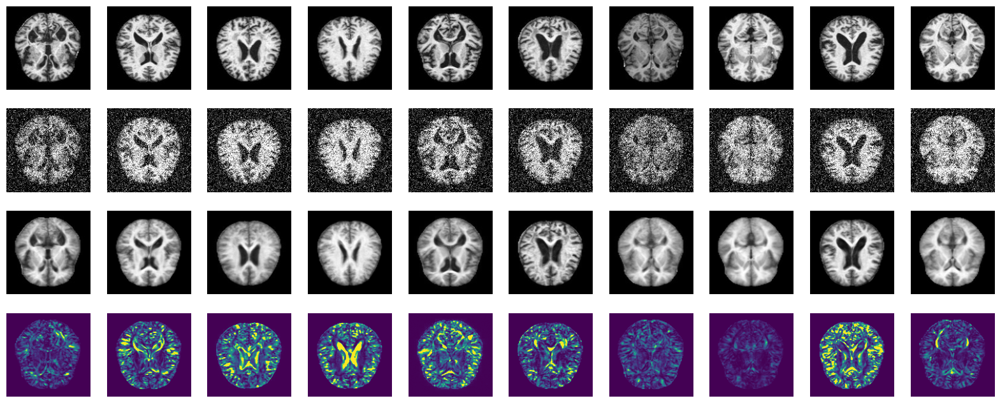

In [ ]:
def plot_mean_variance(train_loader):
  images, _ = next(iter(train_loader))
  # Add noise to images
  corrupted_images = add_gaussian_noise(images, noise_factor)

  corrupted_images = corrupted_images.to(device).view(-1, 128*128)

  model.eval()
  with torch.no_grad():
      _, predictions_mean, predictions_var = model.sample_predict(corrupted_images, Nsamples)

  first_ten_mean = predictions_mean[:10]  # Extracting the first ten samples from predictions_mean
  first_ten_var = predictions_var[:10]    # Extracting the first ten samples from predictions_var

  # Reshaping the samples back into images
  first_ten_mean_images = first_ten_mean.view(-1, image_size, image_size)  # Assuming images are 28x28
  first_ten_var_images = first_ten_var.view(-1, image_size, image_size)    # Assuming images are 28x28

  clean_images = images[:10]
  corrupted_images_subset = corrupted_images.cpu()[:10]
  mean_images = first_ten_mean_images.cpu()
  var_images = first_ten_var_images.cpu()

  fig, axs = plt.subplots(4, 10, figsize=(20, 8))

  for i in range(10):
      # Plot clean images
      im_clean = axs[0, i].imshow(clean_images[i].view(image_size, image_size), cmap='gray')
      axs[0, i].axis('off')

      # Plot corrupted images
      im_corrupted = axs[1, i].imshow(corrupted_images_subset[i].view(image_size, image_size), cmap='gray')
      axs[1, i].axis('off')

      # Plot denoised (mean) images
      im_mean = axs[2, i].imshow(mean_images[i], cmap='gray')
      axs[2, i].axis('off')

      # Plot uncertainty (variance) images
      im_var = axs[3, i].imshow(var_images[i], cmap='viridis', vmax=0.004)
      axs[3, i].axis('off')


  # Add colorbars for the uncertainty (variance) images
  # fig.colorbar(im_var, ax=axs[3, :], shrink=0.6)

  plt.show()

plot_mean_variance(val_loader)